In [1]:
import pandas as pd
from tqdm import tqdm

import snscrape.modules.twitter as sntwitter

import re, string
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import pyLDAvis
import pyLDAvis.sklearn

from wordcloud import WordCloud
import matplotlib.pyplot as plt

Processing mention wordcloud images...


  0%|          | 0/5 [00:00<?, ?it/s]

Processing ganjar


 20%|██        | 1/5 [00:09<00:39,  9.79s/it]

Processing prabowo


 40%|████      | 2/5 [00:19<00:29,  9.83s/it]

Processing anies


 60%|██████    | 3/5 [00:29<00:20, 10.02s/it]

Processing ahy


 80%|████████  | 4/5 [00:40<00:10, 10.32s/it]

Processing ridwan


100%|██████████| 5/5 [00:51<00:00, 10.39s/it]


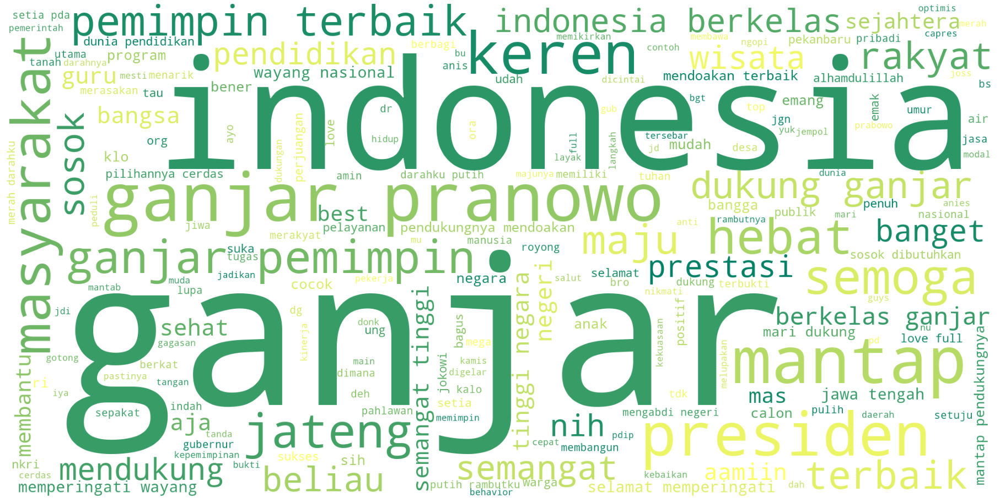

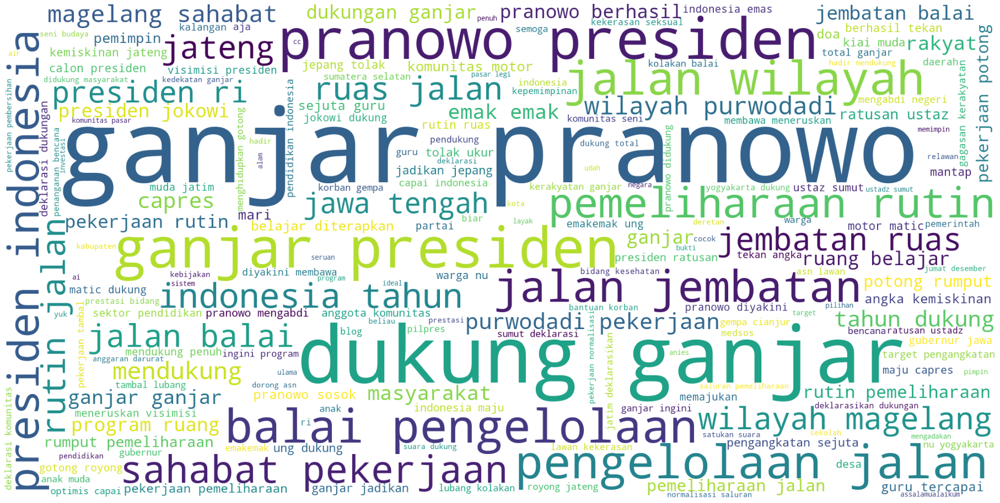

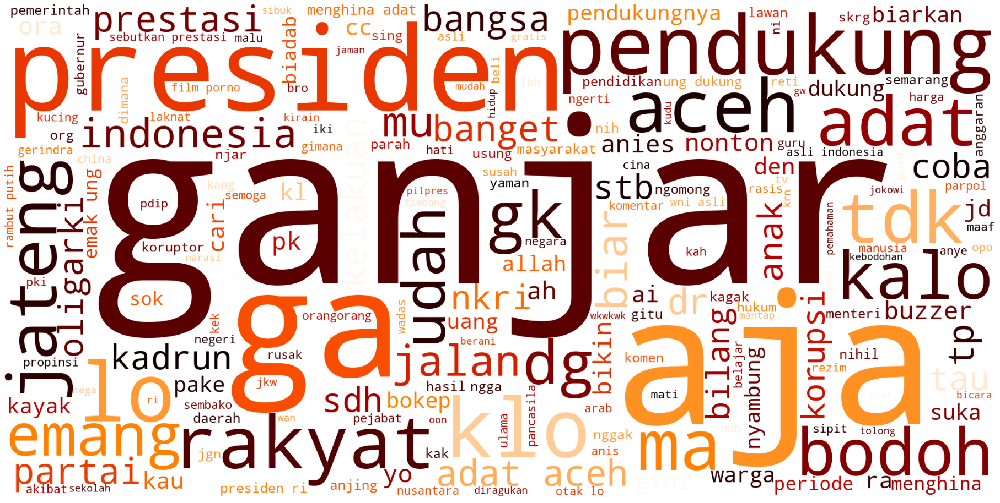

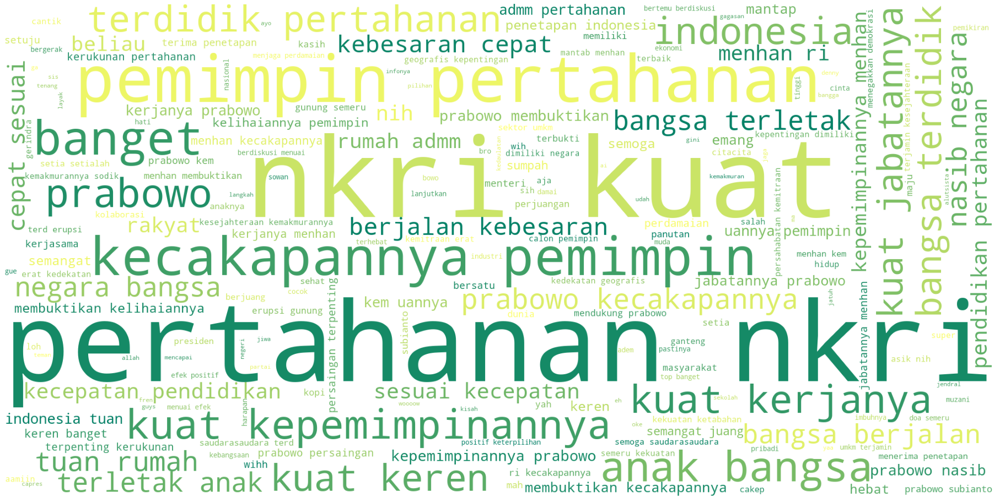

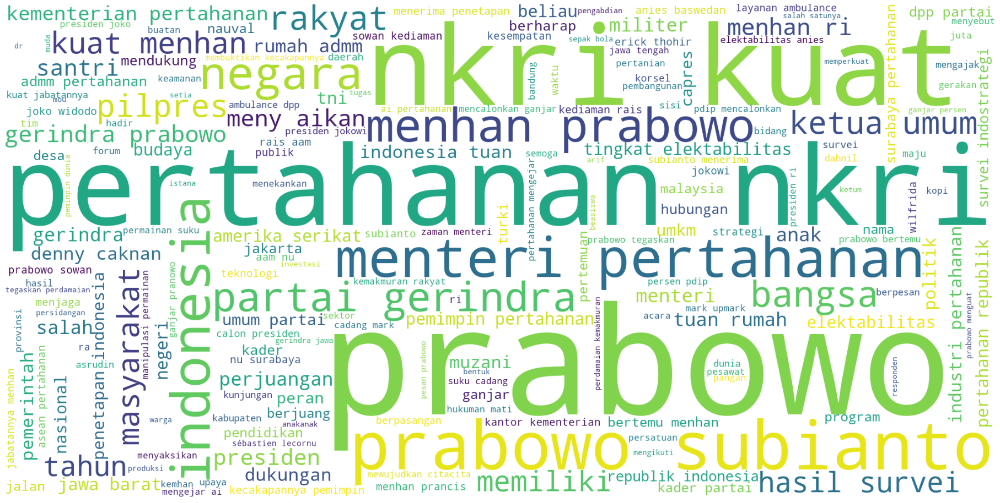

...

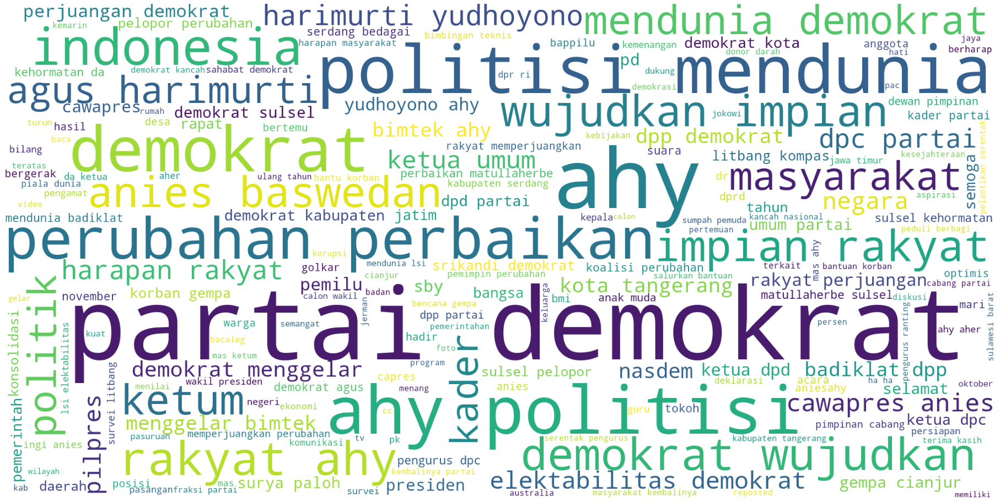

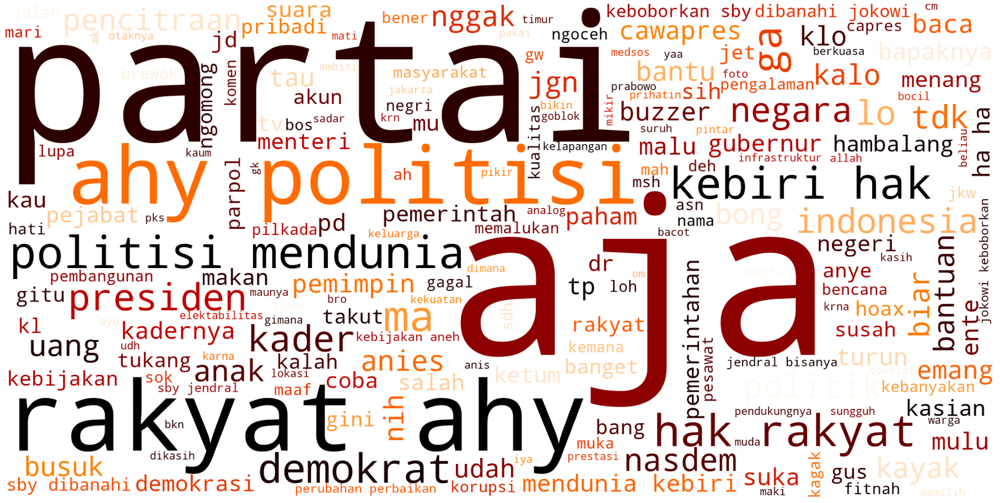

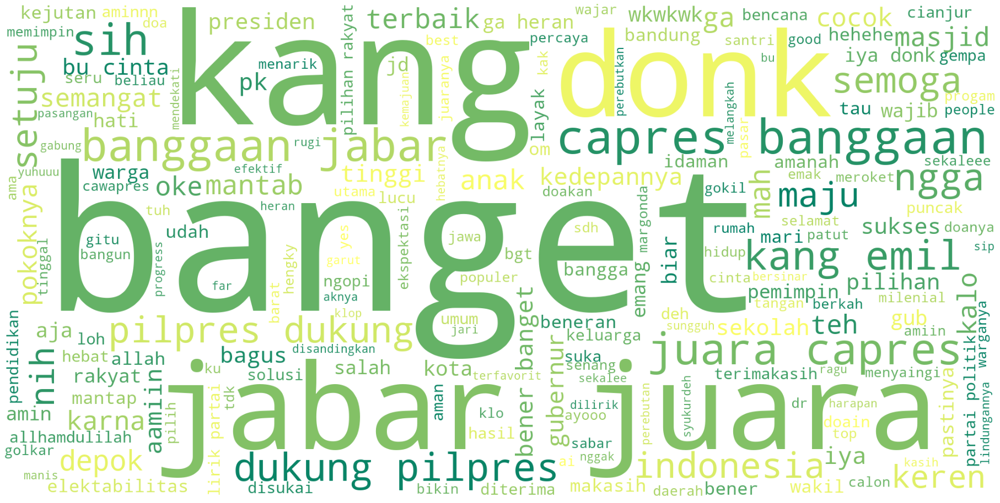

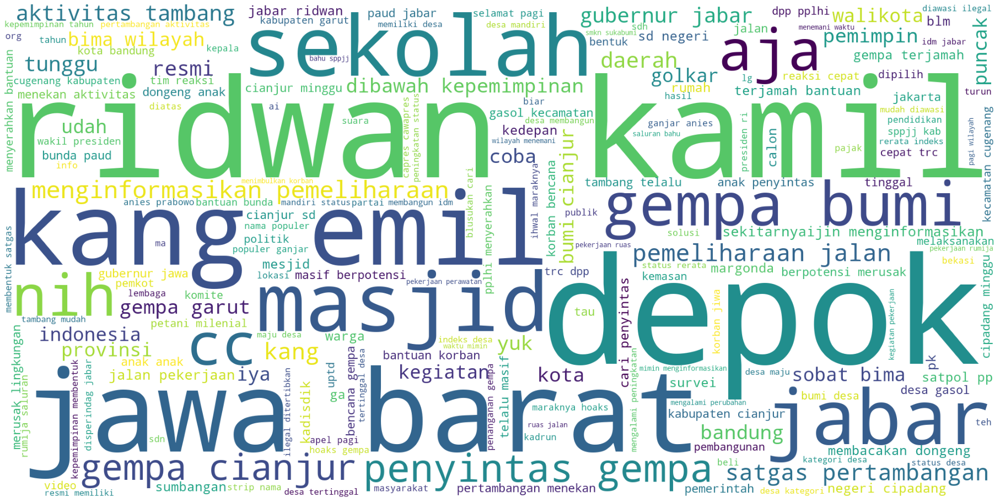

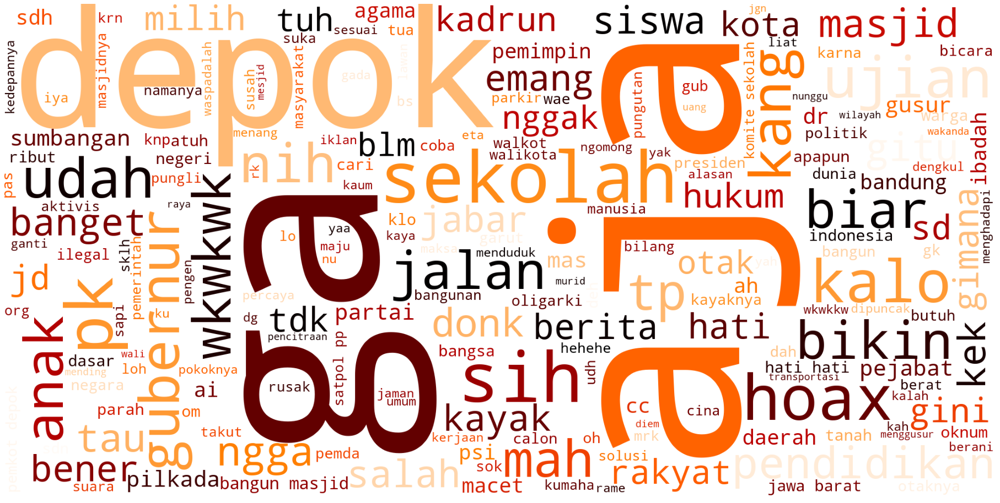

In [8]:
df_string = ['ganjar', 'prabowo', 'anies', 'ahy', 'ridwan']

# =====================
# ===== Load Data =====
# =====================
df_pos_ganjar = pd.read_csv(r"./output/sentiment/pos_ganjar.csv")
df_neu_ganjar = pd.read_csv(r"./output/sentiment/neu_ganjar.csv")
df_neg_ganjar = pd.read_csv(r"./output/sentiment/neg_ganjar.csv")

df_pos_prabowo = pd.read_csv(r"./output/sentiment/pos_prabowo.csv")
df_neu_prabowo = pd.read_csv(r"./output/sentiment/neu_prabowo.csv")
df_neg_prabowo = pd.read_csv(r"./output/sentiment/neg_prabowo.csv")

df_pos_anies = pd.read_csv(r"./output/sentiment/pos_anies.csv")
df_neu_anies = pd.read_csv(r"./output/sentiment/neu_anies.csv")
df_neg_anies = pd.read_csv(r"./output/sentiment/neg_anies.csv")

df_pos_ahy = pd.read_csv(r"./output/sentiment/pos_ahy.csv")
df_neu_ahy = pd.read_csv(r"./output/sentiment/neu_ahy.csv")
df_neg_ahy = pd.read_csv(r"./output/sentiment/neg_ahy.csv")

df_pos_ridwan = pd.read_csv(r"./output/sentiment/pos_ridwan.csv")
df_neu_ridwan = pd.read_csv(r"./output/sentiment/neu_ridwan.csv")
df_neg_ridwan = pd.read_csv(r"./output/sentiment/neg_ridwan.csv")

df_sens = [[df_pos_ganjar, df_neu_ganjar, df_neg_ganjar], [df_pos_prabowo, df_neu_prabowo, df_neg_prabowo],
[df_pos_anies, df_neu_anies, df_neg_anies], [df_pos_ahy, df_neu_ahy, df_neg_ahy],
[df_pos_ridwan, df_neu_ridwan, df_neg_ridwan]]

# =============================
# ===== Wordcloud Mention =====
# =============================
labels = ['pos', 'neu', 'neg']
print('Processing mention wordcloud images...')
# ___Join list as 1 string, and save wordcloud image___

for df_list in tqdm(range(len(df_sens))):
    print('Processing {}'.format(df_string[df_list]))
    for branch in range(len(df_sens[df_list])):
        text_content = list(df_sens[df_list][branch]['0'])

        text_string = ''
        for elem in text_content:
            text_string = ' '.join([text_string, str(elem)])
        
        # Colour
        if branch == 0:
            wordcloud = WordCloud(background_color='white', width=2000, height=1000, colormap='summer').generate(text_string)
        elif branch == 1:
            wordcloud = WordCloud(background_color='white', width=2000, height=1000).generate(text_string)
        else:
            wordcloud = WordCloud(background_color='white', width=2000, height=1000, colormap='gist_heat').generate(text_string)

        # plot wordcloud
        plt.figure(figsize=(25,15))
        image = plt.imshow(wordcloud)

        # Hapus nilai axis
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.savefig('./output/temp/{}/wordcloud_mention_{}_{}.jpg'.format(df_string[df_list], df_string[df_list], labels[branch]))